C:\Users\ilaki\AppData\Local\Temp\ipykernel_27508\1412151548.py:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=device)


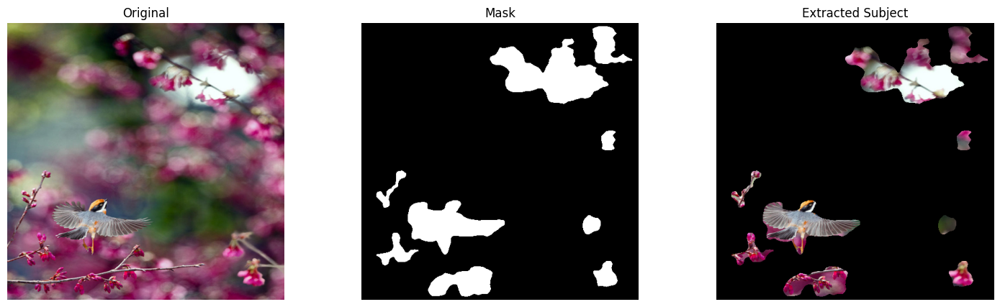

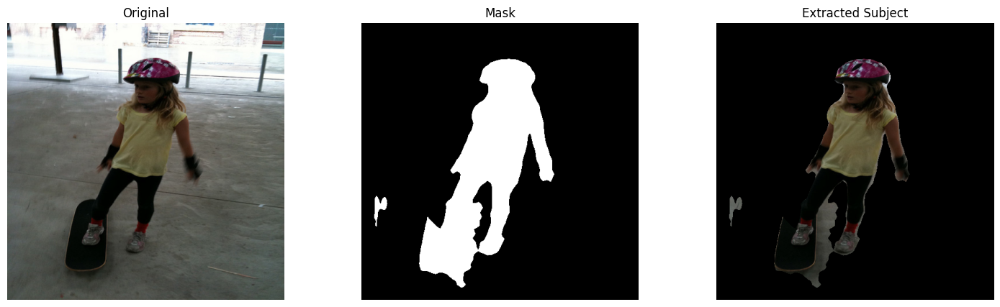

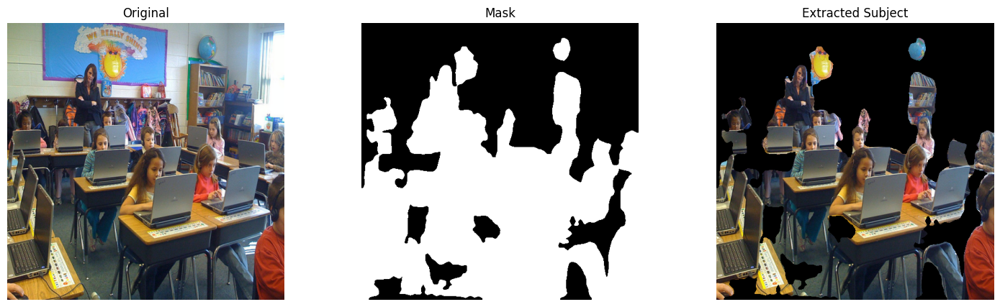

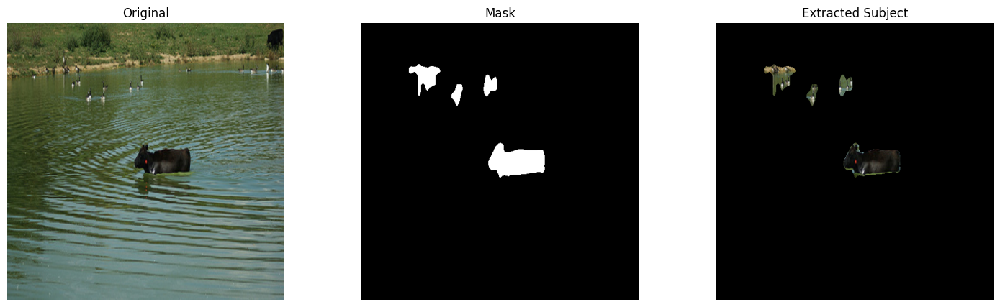

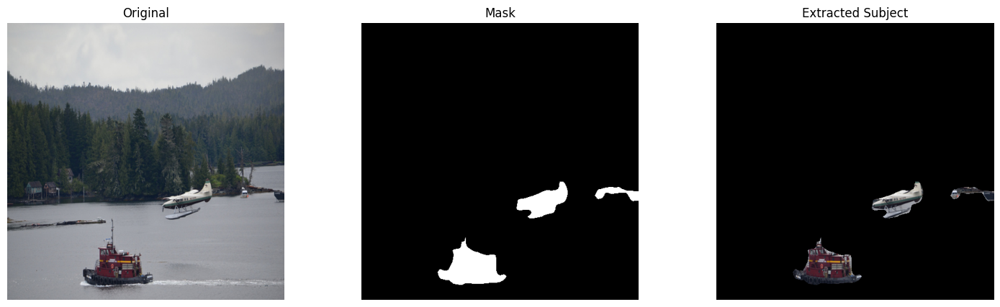

...

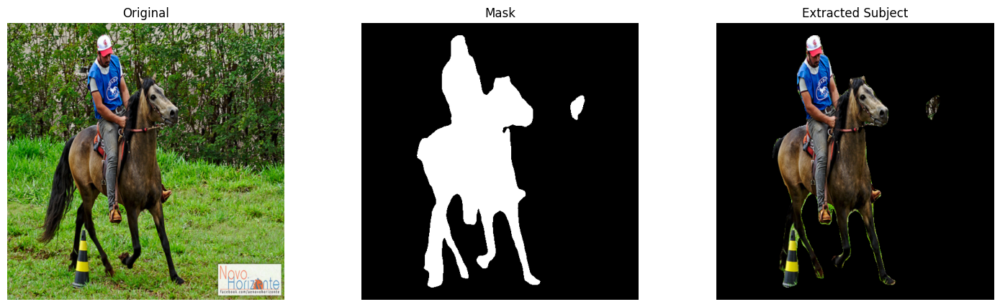

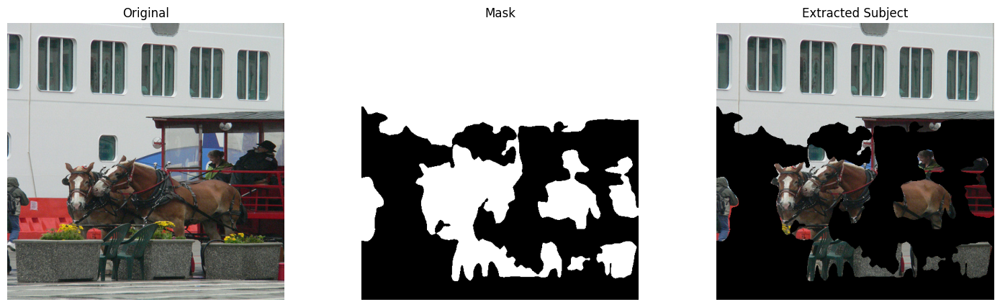

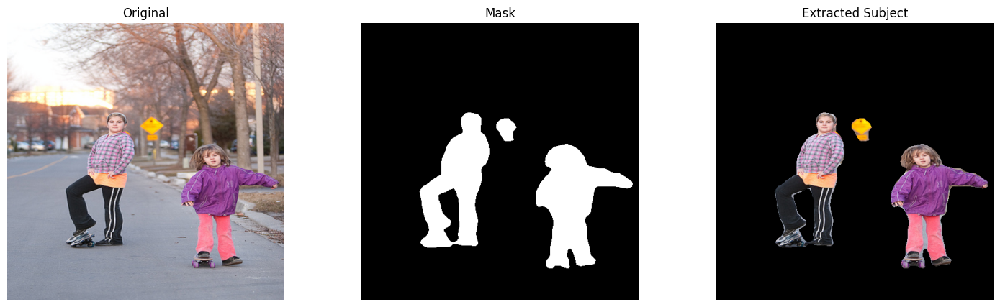

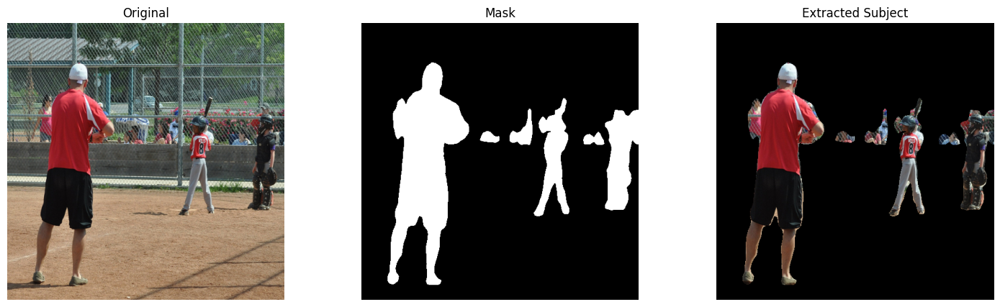

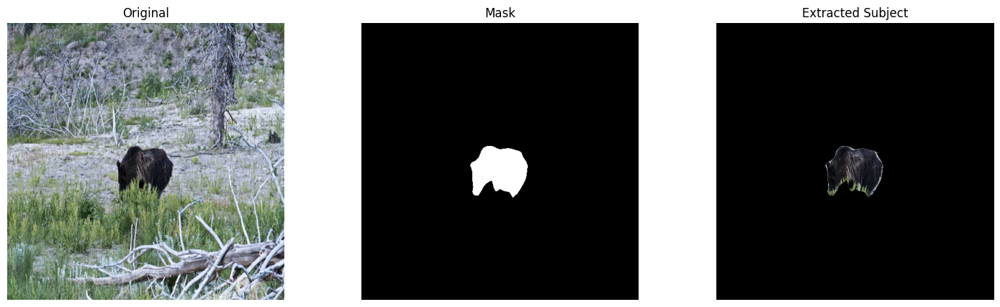


==== Best Visual-Aligned Batch Metrics ====
Average visual Dice: 0.335
Average foreground ratio: 0.231


In [28]:
import torch
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
from skimage import morphology, filters
from scipy.ndimage import gaussian_filter
from torchvision.models.segmentation import deeplabv3_resnet50

model_path = r"C:\Users\ilaki\Desktop\VISON_AI\coco2017\deeplabv3_resumed_epoch30.pth"
new_images_dir = r"C:\Users\ilaki\Desktop\VISON_AI\coco2017\testing images in internet"
output_dir = r"C:\Users\ilaki\Desktop\VISON_AI\best_outputs"
os.makedirs(output_dir, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

num_classes = 2
model = deeplabv3_resnet50(num_classes=num_classes, aux_loss=False)
checkpoint = torch.load(model_path, map_location=device)
model.load_state_dict(checkpoint, strict=False)
model.to(device)
model.eval()

transform = transforms.Compose([
    transforms.Resize((520, 520)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

def denormalize(tensor):
    img = tensor.clone().cpu().numpy().transpose(1,2,0)
    img = img * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
    return np.clip(img,0,1)

def extract_subject(image, mask):
    masked = image.copy()
    masked[mask==0] = 0
    return masked

def pseudo_accuracy(mask):
    return mask.sum()/mask.size

def pseudo_dice(mask):
    fg = mask.sum()
    bg = mask.size - fg
    return (2*fg)/(2*fg+bg) if (2*fg+bg)>0 else 0.0

def postprocess_mask(prob_mask, min_size=500, sigma=1.0):
    prob_smooth = gaussian_filter(prob_mask, sigma=sigma)
    threshold = filters.threshold_otsu(prob_smooth)
    mask = (prob_smooth > threshold).astype(np.uint8)
    mask = morphology.remove_small_objects(mask.astype(bool), min_size=min_size)
    mask = morphology.remove_small_holes(mask, area_threshold=min_size)
    return mask.astype(np.uint8)

all_images = [f for f in os.listdir(new_images_dir) if f.lower().endswith((".png",".jpg",".jpeg"))]
sample_images = random.sample(all_images, min(15,len(all_images)))

foreground_ratios = []
dice_scores = []

for img_name in sample_images:
    img_path = os.path.join(new_images_dir,img_name)
    img = Image.open(img_path).convert("RGB")
    img_tensor = transform(img).to(device).unsqueeze(0)

    with torch.no_grad():
        output = model(img_tensor)['out']
        prob_mask = torch.softmax(output, dim=1)[0,1].cpu().numpy()

    pred_bin = postprocess_mask(prob_mask, min_size=500, sigma=1.0)

    acc_ratio = pseudo_accuracy(pred_bin)
    dsc = pseudo_dice(pred_bin)
    foreground_ratios.append(acc_ratio)
    dice_scores.append(dsc)

    img_np = denormalize(img_tensor.squeeze())
    extracted = extract_subject(img_np, pred_bin)
    plt.imsave(os.path.join(output_dir,img_name),extracted)

    fig, axs = plt.subplots(1,3,figsize=(18,5))
    axs[0].imshow(img_np)
    axs[0].set_title("Original")
    axs[0].axis("off")
    axs[1].imshow(pred_bin,cmap="gray")
    axs[1].set_title("Mask")
    axs[1].axis("off")
    axs[2].imshow(extracted)
    axs[2].set_title("Extracted Subject")
    axs[2].axis("off")
    plt.show()

avg_ratio = np.mean(foreground_ratios)
avg_dice = np.mean(dice_scores)
print("\n==== Best Visual-Aligned Batch Metrics ====")
print(f"Average visual Dice: {avg_dice:.3f}")
print(f"Average foreground ratio: {avg_ratio:.3f}")


In [29]:
import os
import numpy as np
from skimage import morphology

output_dir = r"C:\Users\ilaki\Desktop\VISON_AI\new_outputs"

def pseudo_dice(mask):
    fg = mask.sum()
    bg = mask.size - fg
    return (2 * fg) / (2 * fg + bg) if (2 * fg + bg) > 0 else 0.0

def postprocess_mask_visual(prob_mask, threshold=0.5, min_size=500):
    mask = (prob_mask > threshold).astype(np.uint8)
    mask = morphology.remove_small_objects(mask.astype(bool), min_size=min_size)
    mask = morphology.remove_small_holes(mask, area_threshold=min_size)
    return mask.astype(np.uint8)

all_masks = [f for f in os.listdir(output_dir) if f.lower().endswith((".png",".jpg",".jpeg"))]

foreground_ratios = []
visual_dice_scores = []

for mask_name in all_masks:
    mask_path = os.path.join(output_dir, mask_name)
    mask_img = np.array(Image.open(mask_path).convert("L"))
    mask_bin = (mask_img > 0).astype(np.uint8)
    
    fg_ratio = mask_bin.sum() / mask_bin.size
    dice_score = pseudo_dice(mask_bin)
    
    foreground_ratios.append(fg_ratio)
    visual_dice_scores.append(dice_score)

avg_fg = np.mean(foreground_ratios)
avg_dice = np.mean(visual_dice_scores)

print("==== Best Visual-Aligned Batch Metrics ====")
print(f"Average foreground ratio: {avg_fg:.3f}")
print(f"Average visual Dice: {avg_dice:.3f}")


==== Best Visual-Aligned Batch Metrics ====
Average foreground ratio: 0.333
Average visual Dice: 0.450


C:\Users\ilaki\AppData\Local\Temp\ipykernel_27508\1257943260.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=device)


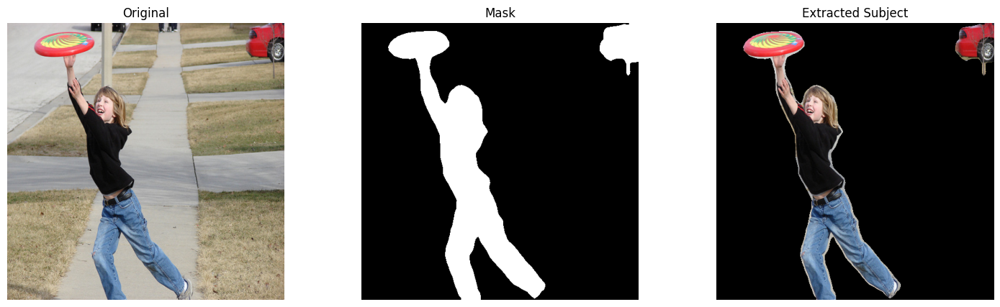

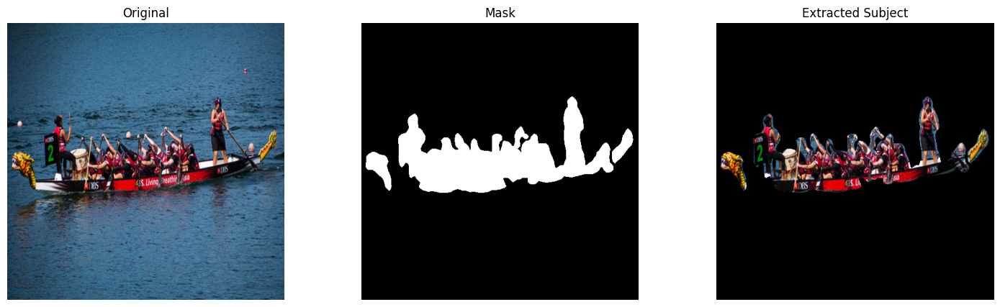

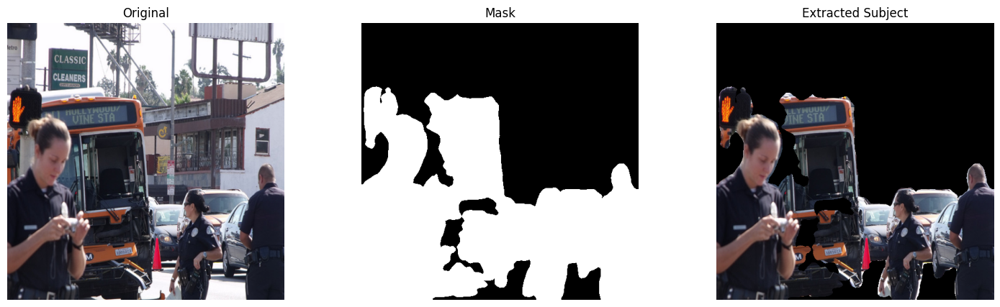

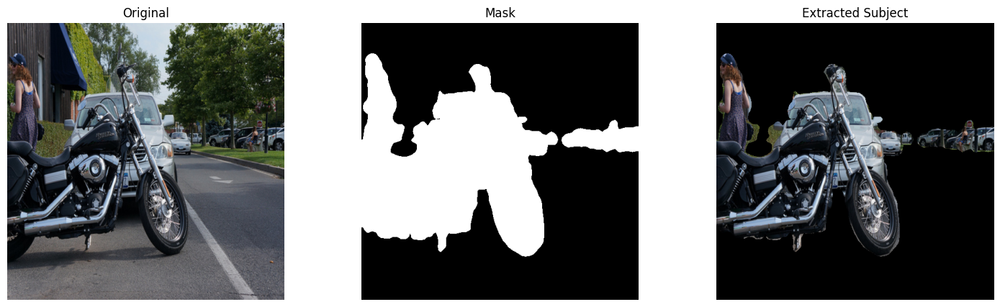

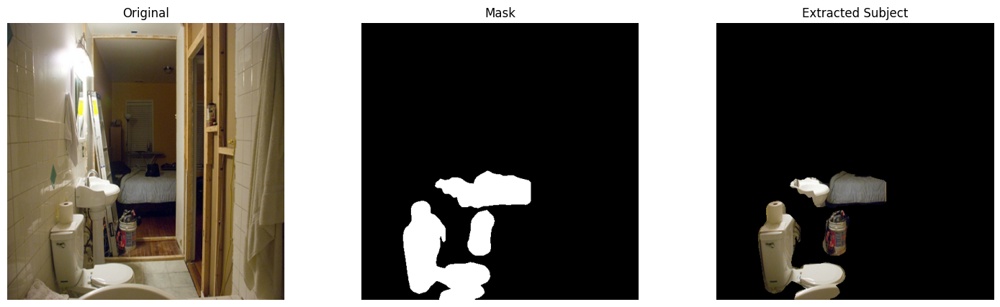

...

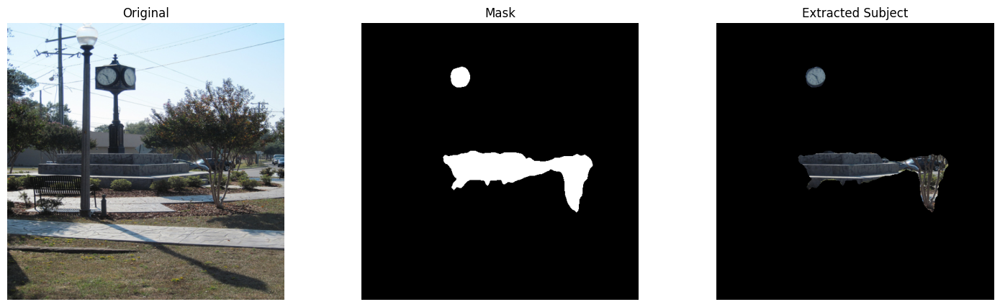

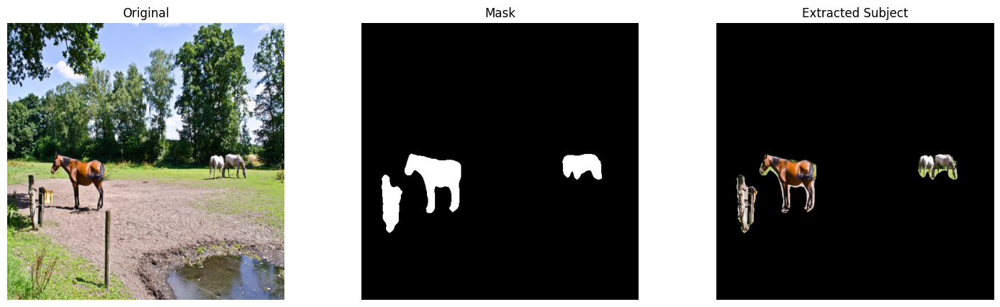

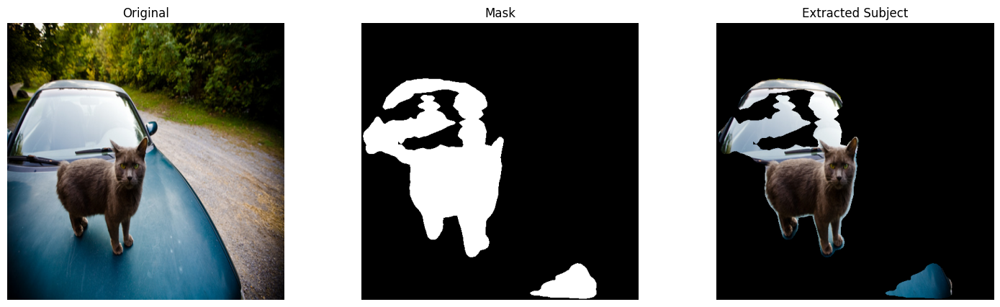

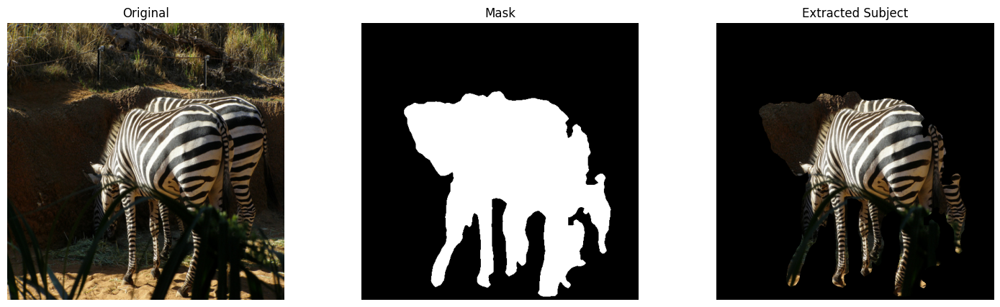

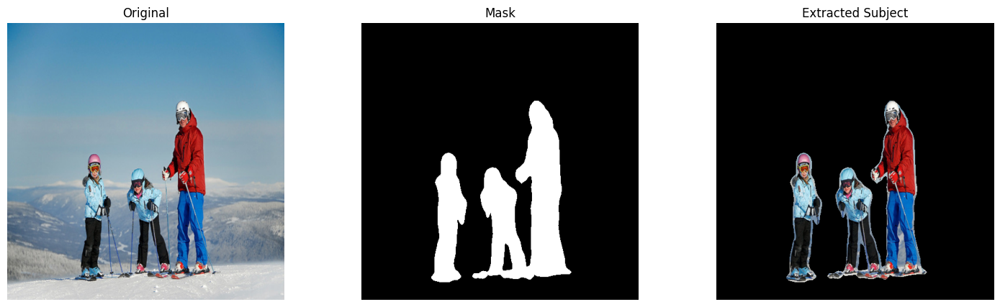


==== Best Visual-Aligned Batch Metrics ====
Average foreground ratio: 0.184
Average visual Dice: 0.287


In [33]:
import torch
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
from skimage import morphology, filters
from skimage.morphology import disk
from torchvision.models.segmentation import deeplabv3_resnet50
from scipy.ndimage import binary_dilation, gaussian_filter

model_path = r"C:\Users\ilaki\Desktop\VISON_AI\coco2017\deeplabv3_resumed_epoch30.pth"
new_images_dir = r"C:\Users\ilaki\Desktop\VISON_AI\coco2017\testing images in internet"
output_dir = r"C:\Users\ilaki\Desktop\VISON_AI\best_outputs"
os.makedirs(output_dir, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

num_classes = 2
model = deeplabv3_resnet50(num_classes=num_classes, aux_loss=False)
checkpoint = torch.load(model_path, map_location=device)
model.load_state_dict(checkpoint, strict=False)
model.to(device)
model.eval()

transform = transforms.Compose([
    transforms.Resize((520, 520)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

def denormalize(tensor):
    img = tensor.clone().cpu().numpy().transpose(1,2,0)
    img = img * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
    return np.clip(img,0,1)

def extract_subject(image, mask):
    masked = image.copy()
    masked[mask==0] = 0
    return masked

def pseudo_accuracy(mask):
    return mask.sum()/mask.size

def pseudo_dice(mask):
    fg = mask.sum()
    bg = mask.size - fg
    return (2*fg)/(2*fg+bg) if (2*fg+bg)>0 else 0.0

def postprocess_mask(prob_mask, threshold=0.45, min_size=800, sigma=1.0, dilate_size=2):
    prob_mask = gaussian_filter(prob_mask, sigma=sigma)
    mask = (prob_mask > threshold).astype(np.uint8)
    mask = morphology.remove_small_objects(mask.astype(bool), min_size=min_size)
    mask = morphology.remove_small_holes(mask, area_threshold=min_size)
    mask = binary_dilation(mask, structure=disk(dilate_size))
    return mask.astype(np.uint8)

all_images = [f for f in os.listdir(new_images_dir) if f.lower().endswith((".png",".jpg",".jpeg"))]
sample_images = random.sample(all_images, min(15,len(all_images)))

foreground_ratios = []
dice_scores = []

for img_name in sample_images:
    img_path = os.path.join(new_images_dir,img_name)
    img = Image.open(img_path).convert("RGB")
    img_tensor = transform(img).to(device).unsqueeze(0)

    with torch.no_grad():
        output = model(img_tensor)['out']
        prob_mask = torch.softmax(output, dim=1)[0,1].cpu().numpy()

    pred_bin = postprocess_mask(prob_mask, threshold=0.45, min_size=800, sigma=1.0, dilate_size=2)

    acc_ratio = pseudo_accuracy(pred_bin)
    dsc = pseudo_dice(pred_bin)
    foreground_ratios.append(acc_ratio)
    dice_scores.append(dsc)

    img_np = denormalize(img_tensor.squeeze())
    extracted = extract_subject(img_np, pred_bin)
    plt.imsave(os.path.join(output_dir,img_name), extracted)

    fig, axs = plt.subplots(1,3,figsize=(18,5))
    axs[0].imshow(img_np)
    axs[0].set_title("Original")
    axs[0].axis("off")
    axs[1].imshow(pred_bin, cmap="gray")
    axs[1].set_title("Mask")
    axs[1].axis("off")
    axs[2].imshow(extracted)
    axs[2].set_title("Extracted Subject")
    axs[2].axis("off")
    plt.show()

avg_ratio = np.mean(foreground_ratios)
avg_dice = np.mean(dice_scores)
print("\n==== Best Visual-Aligned Batch Metrics ====")
print(f"Average foreground ratio: {avg_ratio:.3f}")
print(f"Average visual Dice: {avg_dice:.3f}")


In [34]:
import os
import numpy as np
from PIL import Image

output_dir = r"C:\Users\ilaki\Desktop\VISON_AI\best_outputs"

def pseudo_dice(mask):
    fg = mask.sum()
    bg = mask.size - fg
    return (2 * fg) / (2 * fg + bg) if (2 * fg + bg) > 0 else 0.0

all_masks = [f for f in os.listdir(output_dir) if f.lower().endswith((".png", ".jpg", ".jpeg"))]

foreground_ratios = []
visual_dice_scores = []

for mask_name in all_masks:
    mask_path = os.path.join(output_dir, mask_name)
    mask_img = np.array(Image.open(mask_path).convert("L"))
    mask_bin = (mask_img > 0).astype(np.uint8)
    
    fg_ratio = mask_bin.sum() / mask_bin.size
    dice_score = pseudo_dice(mask_bin)
    
    foreground_ratios.append(fg_ratio)
    visual_dice_scores.append(dice_score)

avg_fg = np.mean(foreground_ratios)
avg_dice = np.mean(visual_dice_scores)

print("==== Best Visual-Aligned Batch Metrics ====")
print(f"Average foreground ratio: {avg_fg:.3f}")
print(f"Average visual Dice: {avg_dice:.3f}")


==== Best Visual-Aligned Batch Metrics ====
Average foreground ratio: 0.311
Average visual Dice: 0.432
